## 1- Importing Packages 🗂️


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')

## 2- Load & Read Data 🗃️


In [2]:
# loading the dataset to pandas dataframe
data = pd.read_csv("/content/globalterrorismdb_0718dist.csv" , encoding='ISO-8859-1')
# Success
print("The dataset has {} data points with {} variables each.".format(*data.shape))

The dataset has 181691 data points with 135 variables each.


In [3]:
# let's see the first 5 rows of the data
data.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [4]:
# Let's see the last 5 rows of data
data.tail()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
181686,201712310022,2017,12,31,NaN,0,NaN,182,Somalia,11,...,NaN,"""Somalia: Al-Shabaab Militants Attack Army Che...","""Highlights: Somalia Daily Media Highlights 2 ...","""Highlights: Somalia Daily Media Highlights 1 ...",START Primary Collection,0,0,0,0,NaN
181687,201712310029,2017,12,31,NaN,0,NaN,200,Syria,10,...,NaN,"""Putin's 'victory' in Syria has turned into a ...","""Two Russian soldiers killed at Hmeymim base i...","""Two Russian servicemen killed in Syria mortar...",START Primary Collection,-9,-9,1,1,NaN
181688,201712310030,2017,12,31,NaN,0,NaN,160,Philippines,5,...,NaN,"""Maguindanao clashes trap tribe members,"" Phil...",NaN,NaN,START Primary Collection,0,0,0,0,NaN
181689,201712310031,2017,12,31,NaN,0,NaN,92,India,6,...,NaN,"""Trader escapes grenade attack in Imphal,"" Bus...",NaN,NaN,START Primary Collection,-9,-9,0,-9,NaN
181690,201712310032,2017,12,31,NaN,0,NaN,160,Philippines,5,...,NaN,"""Security tightened in Cotabato following IED ...","""Security tightened in Cotabato City,"" Manila ...",NaN,START Primary Collection,-9,-9,0,-9,NaN


In [5]:
# let's see randomly
data.sample(5)

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
46777,199106110008,1991,6,11,NaN,0,NaN,83,Guatemala,2,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,0,-9,NaN
67963,199807210005,1998,7,21,NaN,0,NaN,118,Macedonia,9,...,NaN,Explosion at Yugoslav Border Destroys Locomot...,"MIC News Bulletin, Interior Ministry issues s...","Beta News Agency, Three Bomb Blasts Reported,...",CETIS,-9,-9,0,-9,"199807210005, 199807200003, 199807210006"
39515,198909040014,1989,9,4,NaN,0,NaN,145,Nicaragua,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
69746,199911250003,1999,11,25,NaN,0,NaN,69,France,8,...,NaN,Two bombs explode after caller threatens blas...,France Beefs Up Security in Corsica After Bom...,Corsica blasts renew fears of separatist viol...,CETIS,0,0,0,0,"199911250003, 199911250004"
160997,201604090059,2016,4,9,NaN,0,NaN,45,Colombia,3,...,NaN,"""A dead soldier and another wounded man leave ...","""Colombia Guerrilla Update: ELN Ambush Leaves ...",NaN,START Primary Collection,0,0,0,0,NaN


## 3- Exploatroy Data Analysis 📊
- It's the first step in working with data ,we look at it closely to see what's there. Our goal in this part is to understand our data better to make smart decisions about what to do next.

In [6]:
# checking the number of rows and columns in dataframe
print(data.shape)

(181691, 135)


In [7]:
# check missing values
data.isnull().sum()

eventid            0
iyear              0
imonth             0
iday               0
approxdate    172452
               ...  
INT_LOG            0
INT_IDEO           0
INT_MISC           0
INT_ANY            0
related       156653
Length: 135, dtype: int64

In [8]:
# Let's see our data columns
data.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)

<b> As can be seen, we have a lot of data columns, as well as unclear attribute names, so we delete some of the unimportant columns, so we can look at the columns and check what they are. </b>

- First, let's delete unimportant and rename our important columns

In [9]:
# renaming
data.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','provstate':'state',
                       'region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed',
                       'nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type',
                       'weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)

In [10]:
# Taking important data in whole dataset
data = data[['Year','extended','Month','Day','Country','state','Region','city','latitude','longitude','AttackType','Killed',
               'Wounded','Target','Group','Target_type','Weapon_type']]

In [11]:
# Now let's see the new version of our data
data.head()

,Year,extended,Month,Day,Country,state,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Group,Target_type,Weapon_type
0,1970,0,7,2,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,MANO-D,Private Citizens & Property,Unknown
1,1970,0,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,Government (Diplomatic),Unknown
2,1970,0,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,Unknown,Journalists & Media,Unknown
3,1970,0,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,Unknown,Government (Diplomatic),Explosives
4,1970,0,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,Unknown,Government (Diplomatic),Incendiary


In [12]:
# checking the number of rows and columns in dataframe again
print(data.shape)

(181691, 17)


In [13]:
# Checking the null velues in data
data.isnull().sum()

Year               0
extended           0
Month              0
Day                0
Country            0
state            421
Region             0
city             435
latitude        4556
longitude       4557
AttackType         0
Killed         10313
Wounded        16311
Target           638
Group              0
Target_type        0
Weapon_type        0
dtype: int64

In [14]:
# Get information about DataFrame
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 17 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Year         181691 non-null  int64  
 1   extended     181691 non-null  int64  
 2   Month        181691 non-null  int64  
 3   Day          181691 non-null  int64  
 4   Country      181691 non-null  object 
 5   state        181270 non-null  object 
 6   Region       181691 non-null  object 
 7   city         181256 non-null  object 
 8   latitude     177135 non-null  float64
 9   longitude    177134 non-null  float64
 10  AttackType   181691 non-null  object 
 11  Killed       171378 non-null  float64
 12  Wounded      165380 non-null  float64
 13  Target       181053 non-null  object 
 14  Group        181691 non-null  object 
 15  Target_type  181691 non-null  object 
 16  Weapon_type  181691 non-null  object 
dtypes: float64(4), int64(4), object(9)
memory usage: 23.6+ MB
None


In [15]:
# statistical measure of dataset
data.describe()

,Year,extended,Month,Day,latitude,longitude,Killed,Wounded
count,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,171378.000000,165380.000000
mean,2002.638997,0.045346,6.467277,15.505644,23.498343,-4.586957e+02,2.403272,3.167668
std,13.259430,0.208063,3.388303,8.814045,18.569242,2.047790e+05,11.545741,35.949392
min,1970.000000,0.000000,0.000000,0.000000,-53.154613,-8.618590e+07,0.000000,0.000000
25%,1991.000000,0.000000,4.000000,8.000000,11.510046,4.545640e+00,0.000000,0.000000
50%,2009.000000,0.000000,6.000000,15.000000,31.467463,4.324651e+01,0.000000,0.000000
75%,2014.000000,0.000000,9.000000,23.000000,34.685087,6.871033e+01,2.000000,2.000000
max,2017.000000,1.000000,12.000000,31.000000,74.633553,1.793667e+02,1570.000000,8191.000000


In [16]:
# group data by region and calculate aggregate statistics
attacks_region = data.groupby('Region').agg({'Killed': ['mean', 'sum'],'Wounded': ['mean', 'sum']})
print(attacks_region)

                               Killed              Wounded          
                                 mean       sum       mean       sum
Region                                                              
Australasia & Oceania        0.543478     150.0   0.948905     260.0
Central America & Caribbean  3.578659   28708.0   1.141859    8991.0
Central Asia                 1.788909    1000.0   3.619820    2009.0
East Asia                    1.509830    1152.0  12.170410    9213.0
Eastern Europe               1.489554    7415.0   2.462183   12045.0
Middle East & North Africa   2.855584  137642.0   4.567714  214308.0
North America                1.461790    4916.0   6.456072   21531.0
South America                1.666994   28849.0   0.976671   16704.0
South Asia                   2.300770  101319.0   3.281185  141360.0
Southeast Asia               1.280776   15637.0   2.184064   26259.0
Sub-Saharan Africa           4.918492   78386.0   3.660964   52857.0
Western Europe               0.425

In [17]:
# group data by AttackType and calculate aggregate statistics
attacks_type_grouping = data.groupby('AttackType').agg({'Killed': ['mean', 'sum'],'Wounded': ['mean', 'sum']})
print(attacks_type_grouping)

                                       Killed              Wounded          
                                         mean       sum       mean       sum
AttackType                                                                  
Armed Assault                        3.972369  160297.0   2.015159   77366.0
Assassination                        1.295690   24920.0   0.772101   13887.0
Bombing/Explosion                    1.865717  157321.0   4.507680  372686.0
Facility/Infrastructure Attack       0.372088    3642.0   0.389913    3765.0
Hijacking                            6.135314    3718.0  28.717905   17001.0
Hostage Taking (Barricade Incident)  4.986637    4478.0   4.699052    3966.0
Hostage Taking (Kidnapping)          2.814286   24231.0   0.792087    6446.0
Unarmed Assault                      0.879121     880.0  15.213666   14027.0
Unknown                              4.930866   32381.0   2.385774   14725.0


In [18]:
# Calculate the most frequented country
data['Country'].value_counts().idxmax()

'Iraq'

In [19]:
data['city'].value_counts().index[1]

'Baghdad'

In [20]:
# Most Attack Types
data['AttackType'].value_counts().idxmax()

'Bombing/Explosion'

In [21]:
# group data by year and calculate numbers
attacks_per_year = data.groupby('Year').size()
print(attacks_per_year)

Year
1970      651
1971      471
1972      568
1973      473
1974      581
1975      740
1976      923
1977     1319
1978     1526
1979     2662
1980     2662
1981     2586
1982     2544
1983     2870
1984     3495
1985     2915
1986     2860
1987     3183
1988     3721
1989     4324
1990     3887
1991     4683
1992     5071
1994     3456
1995     3081
1996     3058
1997     3197
1998      934
1999     1395
2000     1814
2001     1906
2002     1333
2003     1278
2004     1166
2005     2017
2006     2758
2007     3242
2008     4805
2009     4721
2010     4826
2011     5076
2012     8522
2013    12036
2014    16903
2015    14965
2016    13587
2017    10900
dtype: int64


In [22]:
# Year with the most attacks
data['Year'].value_counts().idxmax()

2014

## 4- Data Visualization 📉

- so now let's make pictures from data. It helps us to  see patterns, trends, and insights easily by using charts and graphs. Instead of looking at rows of numbers, makes the information clearer and easier to understand.

**1- Identify trends over time (such as number of attacks per year)**

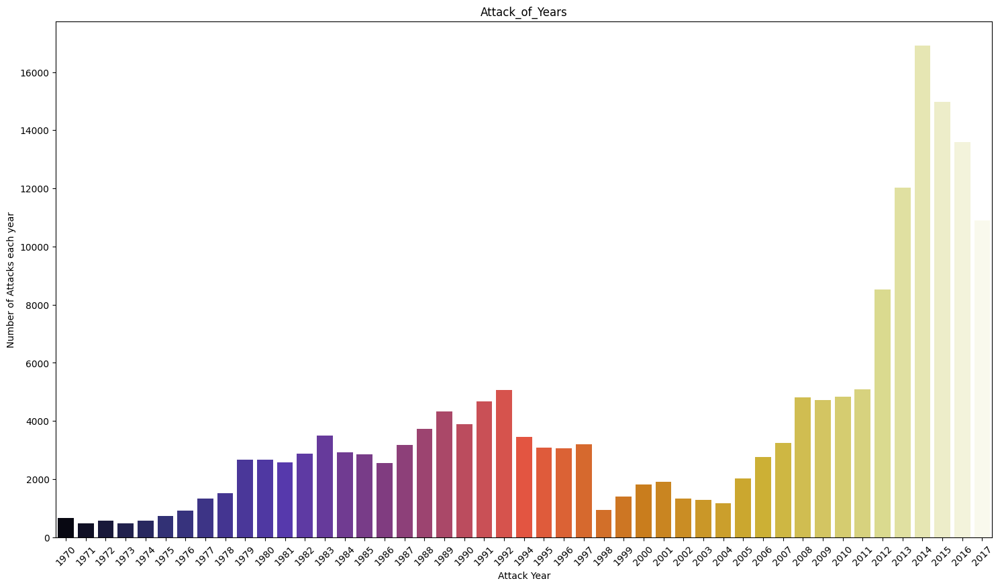

In [23]:
x_year = data['Year'].unique()
y_count_years = data['Year'].value_counts(dropna = False).sort_index()
plt.figure(figsize = (18,10))
sns.barplot(x = x_year,y = y_count_years,palette='CMRmap')
plt.xticks(rotation = 45)
plt.xlabel('Attack Year')
plt.ylabel('Number of Attacks each year')
plt.title('Attack_of_Years')
plt.show()

**2- Identify the most affected regions and countries**

Country
Iraq              24636
Pakistan          14368
Afghanistan       12731
India             11960
Colombia           8306
Philippines        6908
Peru               6096
El Salvador        5320
United Kingdom     5235
Turkey             4292
Name: count, dtype: int64


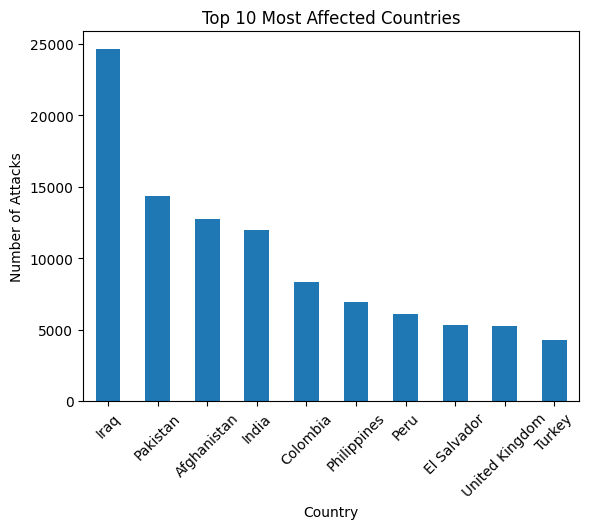

In [24]:
attacks_by_country = data['Country'].value_counts()
top_10_countries = attacks_by_country.head(10)
print(top_10_countries)
top_10_countries.plot(kind='bar')
plt.title('Top 10 Most Affected Countries')
plt.xlabel('Country')
plt.ylabel('Number of Attacks')
plt.xticks(rotation=45)
plt.show()

In [25]:
attacks_by_region = data['Region'].value_counts()
print(attacks_by_region)

Region
Middle East & North Africa     50474
South Asia                     44974
South America                  18978
Sub-Saharan Africa             17550
Western Europe                 16639
Southeast Asia                 12485
Central America & Caribbean    10344
Eastern Europe                  5144
North America                   3456
East Asia                        802
Central Asia                     563
Australasia & Oceania            282
Name: count, dtype: int64


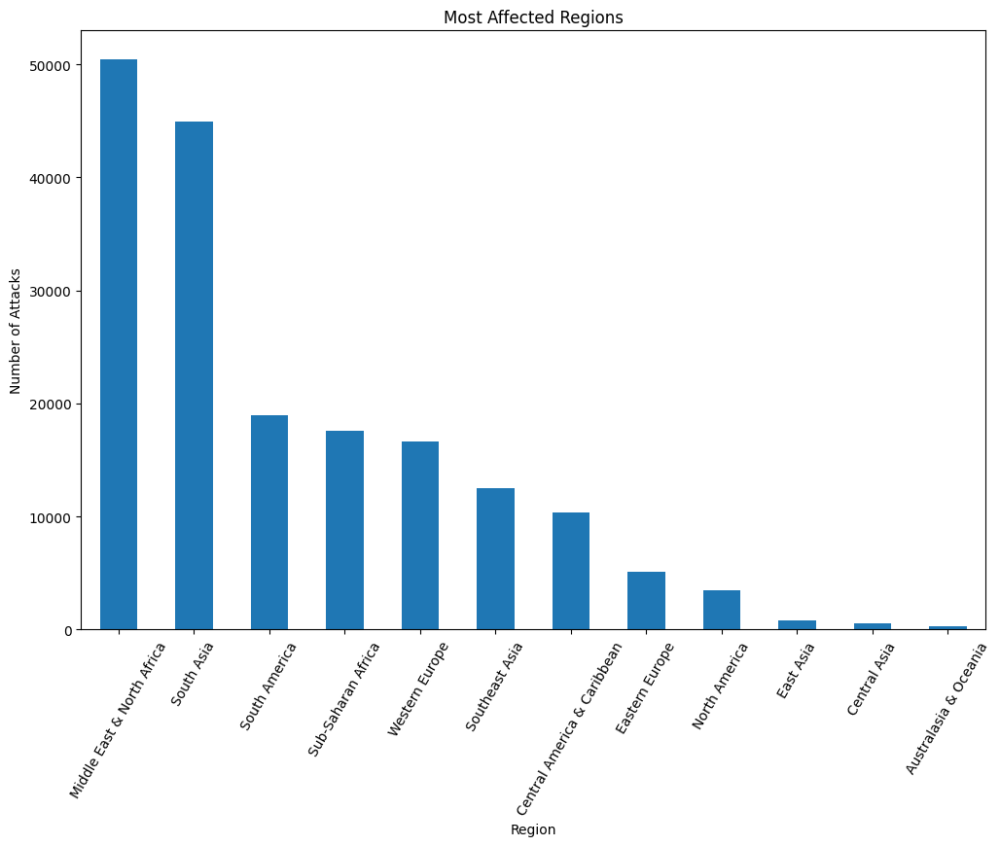

In [26]:
plt.figure(figsize=(12, 8))
attacks_by_region.plot(kind='bar')
plt.title('Most Affected Regions')
plt.xlabel('Region')
plt.ylabel('Number of Attacks')
plt.xticks(rotation=60)
plt.show()

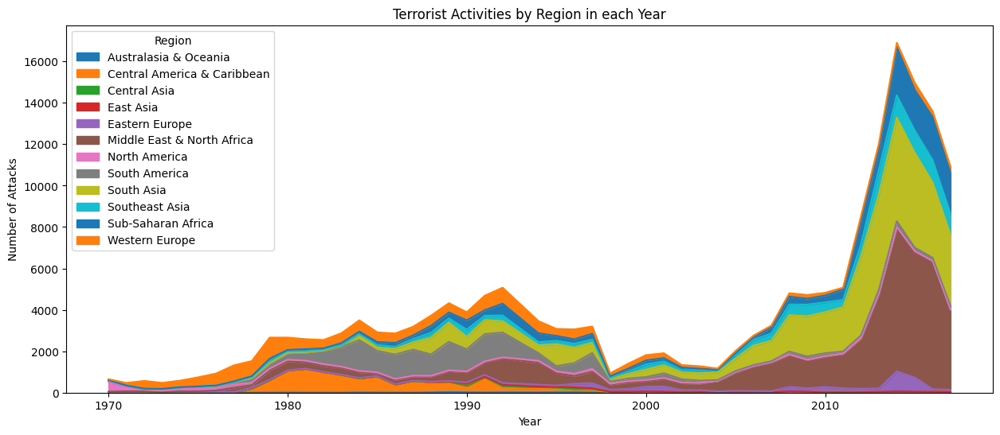

In [27]:
pd.crosstab(data.Year, data.Region).plot(kind='area',figsize=(15,6))
plt.title('Terrorist Activities by Region in each Year')
plt.ylabel('Number of Attacks')
plt.show()

In [28]:
atktype_count = data['AttackType'].value_counts().drop("Unknown")
fig = px.bar(x=atktype_count.keys(),y=atktype_count,color=atktype_count.keys(),
             labels={"x":"Attack Type","y":"Terrorism Attacks"})
fig.update_layout(title={'text':'Attack Types','font_color':'orange','font_family':'Georgia',
                         'font_size':23,'x':0.45,'y':0.97})
fig.show()
print(atktype_count.keys())

Index(['Bombing/Explosion', 'Armed Assault', 'Assassination',
       'Hostage Taking (Kidnapping)', 'Facility/Infrastructure Attack',
       'Unarmed Assault', 'Hostage Taking (Barricade Incident)', 'Hijacking'],
      dtype='object', name='AttackType')


In [29]:
wpntype_count = data['Weapon_type'].value_counts()
fig = px.bar(x=wpntype_count.keys(),y=wpntype_count,color=wpntype_count.keys(),
             labels={"x":"Weapon Type","y":"Terrorism Attacks"})
fig.update_layout(title={'text':' Weapon Types','font_color':'orange','font_family':'Georgia',
                         'font_size':23,'x':0.45,'y':0.97})
fig.show()
print(wpntype_count.keys())

Index(['Explosives', 'Firearms', 'Unknown', 'Incendiary', 'Melee', 'Chemical',
       'Sabotage Equipment',
       'Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)',
       'Other', 'Biological', 'Fake Weapons', 'Radiological'],
      dtype='object', name='Weapon_type')


In [30]:
numerical_data = data.select_dtypes(include=['number'])
correlation_matrix = numerical_data.corr()
fig_heatmap = go.Figure(data=go.Heatmap(z=correlation_matrix.values,x=correlation_matrix.index,y=correlation_matrix.columns,
    colorscale='Viridis'))
fig_heatmap.update_layout(title='Correlation Heatmap of Terrorist Attack Features',xaxis=dict(title='Features'),yaxis=dict(title='Features'))
fig_heatmap.show()

In [31]:
fig = px.scatter_geo(data,lat='latitude',lon='longitude',hover_name='Country',color='Region',title='Geographic Distribution of Terrorist Attacks')
fig.show()

In [32]:
fig = px.scatter_geo(data,lat='latitude',lon='longitude',hover_name='Country',color='Region',animation_frame='Year',title='Spread of Terrorism Over the Years')
fig.show()


## cleaning data 🧹

In [33]:
# Fill missing values with mean for 'Killed' and 'Wounded'
data['Killed'].fillna(data['Killed'].mean(), inplace=True)
data['Wounded'].fillna(data['Wounded'].mean(), inplace=True)

# Fill missing values with mode for 'city' and 'state'
data['city'].fillna(data['city'].mode().iloc[0], inplace=True)
data['state'].fillna(data['state'].mode().iloc[0], inplace=True)

# Drop rows with missing values in 'latitude', 'longitude', 'Target'
data.dropna(subset=['latitude', 'longitude', 'Target'], inplace=True)

In [34]:
# Check for any remaining null values
null_counts = data.isnull().sum()
print(null_counts)

Year           0
extended       0
Month          0
Day            0
Country        0
state          0
Region         0
city           0
latitude       0
longitude      0
AttackType     0
Killed         0
Wounded        0
Target         0
Group          0
Target_type    0
Weapon_type    0
dtype: int64
